In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from fromACC2 import MassPoint, GWStrainCalculator
from matplotlib.patches import Circle

data = pd.read_csv('binary_orbit_data.csv')

data

,Time,Mass1_x,Mass1_y,Mass2_x,Mass2_y,Mass1,Mass2
0,0.000,54545.454545,0.000000,-45454.545455,-0.000000,10,12
1,0.001,54437.821551,3424.937429,-45364.851292,-2854.114524,10,12
2,0.002,54115.347344,6836.358194,-45096.122787,-5696.965162,10,12
3,0.003,53579.304585,10220.798977,-44649.420488,-8517.332481,10,12
4,0.004,52831.808789,13564.902936,-44026.507324,-11304.085780,10,12
...,...,...,...,...,...,...,...
95,0.095,51875.809980,-16855.472420,-43229.841650,14046.227017,10,12
96,0.096,52831.808789,-13564.902936,-44026.507324,11304.085780,10,12
97,0.097,53579.304585,-10220.798977,-44649.420488,8517.332481,10,12
98,0.098,54115.347344,-6836.358194,-45096.122787,5696.965162,10,12


In [11]:
# BINARY MASS SYSTEM ANIMATED

fig, ax = plt.subplots(figsize=(10, 10)) 
plt.axis('off')

# Create background
back = plt.Rectangle((-80000, -80000), 160000, 160000, color='#121212') 

# Create stars
star_1 = plt.Circle((data['Mass1_x'][0], data['Mass1_y'][0]), 2000, color='#3700B3')  
star_2 = plt.Circle((data['Mass2_x'][0], data['Mass2_y'][0]), 2000, color='#BB86FC')  

# Create trajectory lines 
trajectory1, = ax.plot([], [], linestyle='dotted', color='#3700B3', linewidth=1)
trajectory2, = ax.plot([], [], linestyle='dotted', color='#BB86FC', linewidth=1)

# Add background and stars to plot
ax.add_patch(back)
ax.add_patch(star_1)
ax.add_patch(star_2)

# Initialize trajectories
trajectory1.set_data([], [])
trajectory2.set_data([], [])

# Function to update the animation with file data
def update(frame):
    # Update Star 1 position
    star_1.center = (data['Mass1_x'][frame], data['Mass1_y'][frame])
    
    # Update Star 2 position
    star_2.center = (data['Mass2_x'][frame], data['Mass2_y'][frame])
    
    # Update the trajectories
    x1_data = data['Mass1_x'][:frame+1]  # Positions of star 1 up to the current frame
    y1_data = data['Mass1_y'][:frame+1]
    trajectory1.set_data(x1_data, y1_data)

    x2_data = data['Mass2_x'][:frame+1]  # Positions of star 2 up to the current frame
    y2_data = data['Mass2_y'][:frame+1]
    trajectory2.set_data(x2_data, y2_data)

    return star_1, star_2, trajectory1, trajectory2

# Create animation
animation = FuncAnimation(fig, update, frames=len(data), interval=100, blit=True)

# Set the axis limits based on data range
plt.axis('scaled')
plt.xlim(-80000, 80000)
plt.ylim(-80000, 80000)
plt.close()  # Prevents duplicate display of the animation
plt.rcParams['animation.html'] = 'html5'
HTML(animation.to_jshtml())


In [12]:
# STRAIN AMPLITUDE CALCS

trajectory = []

for _, row in data.iterrows():
    # Create MassPoint objects for each mass
    mass1_point = MassPoint(mass=row['Mass1'], x=row['Mass1_x'], y=row['Mass1_y'])
    mass2_point = MassPoint(mass=row['Mass2'], x=row['Mass2_x'], y=row['Mass2_y'])
    
    # Append MassPoint positions to trajectory []
    trajectory.append([mass1_point, mass2_point])

# Set up the strain calculator with parameters
calculator = GWStrainCalculator()
r_observer = 1e20  # 10 kpc
theta = 0          # Overhead observer
phi = 0
dt = data['Time'].iloc[1] - data['Time'].iloc[0]  # Calculate the time step from the CSV

# Calculate strain for each timestep pair
strains = []
for i in range(1, len(trajectory) - 1):
    masses_t1 = trajectory[i - 1]  # Previous time step
    masses_t2 = trajectory[i]      # Current time step
    masses_t3 = trajectory[i + 1]  # Next time step
    
    h_plus, h_cross = calculator.calculate_strain_components(
        masses_t1, masses_t2, masses_t3, dt, r_observer, theta, phi
    )
    strain_amplitude = calculator.calculate_strain_amplitude(h_plus, h_cross)
    strains.append(strain_amplitude)

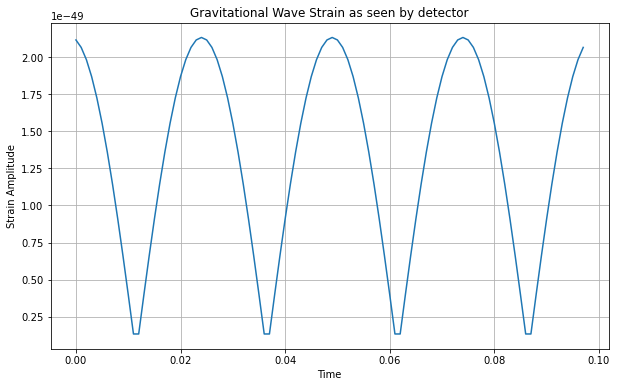

In [13]:
# Plot results
import matplotlib.pyplot as plt
time = data['Time'][:-2]  # Match length to strains array
plt.figure(figsize=(10, 6))
plt.plot(time, strains)
plt.xlabel('Time')
plt.ylabel('Strain Amplitude')
plt.title('Gravitational Wave Strain as seen by detector')
plt.grid(True)
plt.show()

In [14]:
# ANIMATING STRAIN AMPLITUDE PLOT

# Create figure and axis
fig, ax = plt.subplots(figsize=(10, 6))
fig.patch.set_facecolor('black')
ax.set_facecolor('black')

# Plot settings
ax.set_xlim(0, max(time)) 
ax.set_ylim(min(strains) * 1.1, max(strains) * 1.1) 
ax.tick_params(colors='white') 
ax.spines[:].set_color('white')
ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

# Labels
ax.set_xlabel('Time', color='white')
ax.set_ylabel('Strain Amplitude', color='white')

# Initialize waveform line
waveform, = ax.plot([], [], linestyle='-', color='#BB86FC', linewidth=2)

# Animation update function
def update(frame):
    time_data = time[:frame + 1]
    strain_data = strains[:frame + 1]
    waveform.set_data(time_data, strain_data)
    return waveform,

# Create animation
animation = FuncAnimation(fig, update, frames=len(time), interval=100, blit=True)

plt.close()  # Prevents duplicate display of the animation
plt.rcParams['animation.html'] = 'html5'
HTML(animation.to_jshtml())


In [16]:
# COMBINING BOTH ANIMATIONS INTO ONE PLOT

# Create main figure and axis for the orbit animation
fig, ax = plt.subplots(figsize=(12, 12))
fig.patch.set_facecolor('black')
ax.set_facecolor('#121212')
ax.axis('off')

# Create background and stars for the orbit
back = plt.Rectangle((-80000, -80000), 160000, 160000, color='#121212')
star_1 = Circle((data['Mass1_x'][0], data['Mass1_y'][0]), 2000, color='#3700B3')
star_2 = Circle((data['Mass2_x'][0], data['Mass2_y'][0]), 2000, color='#BB86FC')
trajectory1, = ax.plot([], [], linestyle='dotted', color='#3700B3', linewidth=1)
trajectory2, = ax.plot([], [], linestyle='dotted', color='#BB86FC', linewidth=1)

# Add background and stars
ax.add_patch(back)
ax.add_patch(star_1)
ax.add_patch(star_2)
trajectory1.set_data([], [])
trajectory2.set_data([], [])

# Create a subspace for the strain amplitude animation
inset_ax = fig.add_axes([0.7, 0.1, 0.25, 0.25], facecolor='black')  # Adjust position/size as needed
inset_ax.set_xlim(0, max(time))
inset_ax.set_ylim(min(strains) * 1.1, max(strains) * 1.1)
inset_ax.tick_params(colors='white')
inset_ax.spines[:].set_color('white')
inset_ax.xaxis.label.set_color('white')
inset_ax.yaxis.label.set_color('white')
inset_ax.set_xlabel('Time (s)')
inset_ax.set_ylabel('Strain Amplitude')
waveform, = inset_ax.plot([], [], linestyle='-', color='#3700B3', linewidth=2)

# Update function for both animations
def update(frame):
    # Update orbit animation
    star_1.center = (data['Mass1_x'][frame], data['Mass1_y'][frame])
    star_2.center = (data['Mass2_x'][frame], data['Mass2_y'][frame])
    trajectory1.set_data(data['Mass1_x'][:frame+1], data['Mass1_y'][:frame+1])
    trajectory2.set_data(data['Mass2_x'][:frame+1], data['Mass2_y'][:frame+1])
    
    # Update strain animation in the inset
    time_data = time[:frame+1]
    strain_data = strains[:frame+1]
    waveform.set_data(time_data, strain_data)
    
    return star_1, star_2, trajectory1, trajectory2, waveform

# Create animation
animation = FuncAnimation(fig, update, frames=len(time), interval=100, blit=True)

plt.close()  # Prevent duplicate display of the animation
plt.rcParams['animation.html'] = 'html5'
HTML(animation.to_jshtml())


In [ ]:
# Save animation as gif (must have appropriate library)
# pip install pillow
animation.save('orbit_with_strain.gif', writer='pillow', fps=60)